# Приступим к работе...

В данной работе будем использовать   библиотек mahotas.  
Ссылка на библиотеку: https://mahotas.readthedocs.io/en/latest/  
https://www.kaggle.com/datasets?tags=16686-Image+Classification  
https://www.kaggle.com/datasets/umeradnaan/x-ray-dection  
https://www.kaggle.com/datasets/mitgandhi10/dataset-for-cnn  
https://www.kaggle.com/datasets/sanidhyagoel/covid-19-x-ray-classification-dataset  

Вначале представлено тестовые предобработка и обучение, чтобы познакомиться с библиотеками для анализа. Изображения взяты свои, а также два дата сета с рентгеноснимками.

### Начнём обработку изображения  

В начале приведу преобразование тестовых изображений, а затем попробую проанализировать рентгеновские снимки.
В ходе выполнения лабораторной работы первоначально была выбрана библиотека PIL (Python Image Library Pillow), однако она подходит для простых опбазовой обработки изобаражений: обрезка, наложение текста, изменение размера и смена форматов.  

Итак, лучше будем использовать библиотеку OpenCV (Computer Vision Library cv2), которая способна распознавать лица, обрабатывать фото/видео, трекинг объектов. Вдобавок данная библиотека написана на C++, но имеет Python-интерфейс, что даёт высокую производительность и оптимизацию. Также поддерживает матричные операции, детекцию краёв (Canny), морфологические операции, фильтры Гаусса, также совместима с поддержкой GPU (через CUDA).  

##### Загрузка и показ изображений  

Проверка файлов в папке ./static/images/testing...
Проверяется файл: 1.jpg
Загружаем изображение: ./static/images/testing\1.jpg
Проверяется файл: 2.jpg
Загружаем изображение: ./static/images/testing\2.jpg
Проверяется файл: 3.jpg
Загружаем изображение: ./static/images/testing\3.jpg
Проверяется файл: 4.jpg
Загружаем изображение: ./static/images/testing\4.jpg
Проверяется файл: test
Проверяется файл: train


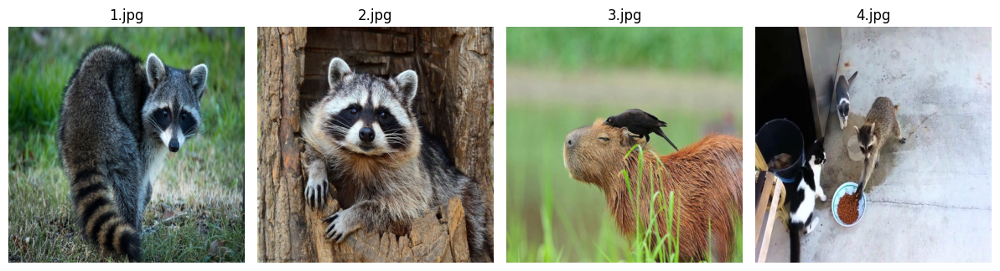

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Функция для загрузки изображений из папки на OpenCV
def load_images(folder, target_size=(512, 512), allowed_extensions=("jpg", "jpeg", "png", "bmp", "gif")):
    images = []
    filenames = []

    if not os.path.exists(folder):
        raise FileNotFoundError(f"Папка {folder} не найдена.")
    
    # Отладочное сообщение
    print(f"Проверка файлов в папке {folder}...")

    # Перебираем все файлы в папке
    for filename in sorted(os.listdir(folder)):
        # Отладочное сообщение
        print(f"Проверяется файл: {filename}")
        
        if filename.lower().endswith(allowed_extensions):
            image_path = os.path.join(folder, filename)  # Полный путь к изображению
            print(f"Загружаем изображение: {image_path}")  # Отладочное сообщение
            
            try:
                # Загружаем изображение с OpenCV
                image = cv2.imread(image_path)
                if image is None:
                    print(f"Ошибка загрузки: {filename}")
                    continue
                
                # Изменяем размер изображения
                image_resized = cv2.resize(image, target_size)

                # Добавляем изображение в список
                images.append(image_resized)
                
                # Добавляем имя файла
                filenames.append(filename)
            except Exception as e:
                print(f"Ошибка при загрузке и обработке изображения {filename}: {e}")

    return images, filenames
                               

# Сохранение файла
# mh.imsave()

# Указываем путь к папке с изображениями
folder_path = "./static/images/testing"
images, filenames = load_images(folder_path)

# Проверяем, были ли загружены изображения
if not images:
    print("Нет изображений для отображения.")
else:
    # Ограничиваем количество изображений для отображения
    count_images_to_display = min(20, len(images))

    # Количество столбцов для отображения
    cols = 5
    rows = count_images_to_display // cols + (count_images_to_display % cols > 0)

# Настройка фигуры для отображения
    plt.figure(figsize=(15, 5 * rows))
    for i in range(count_images_to_display):
        plt.subplot(rows, cols, i + 1)
        # Отображаем изображение и Конвертируем BGR -> RGB
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(f"{filenames[i]}")    # Подпись с именем файла
        plt.axis('off') # Отключаем оси
    
    # Отображаем изображения
    plt.tight_layout() 
    plt.show()

## Предбработка изображений  
### Получение размера изобржаеин   

'Изображение 1: 512x512px'

786432

'Изображение 2: 512x512px'

786432

'Изображение 3: 512x512px'

786432

'Изображение 4: 512x512px'

786432



 Получение RGB матрицы


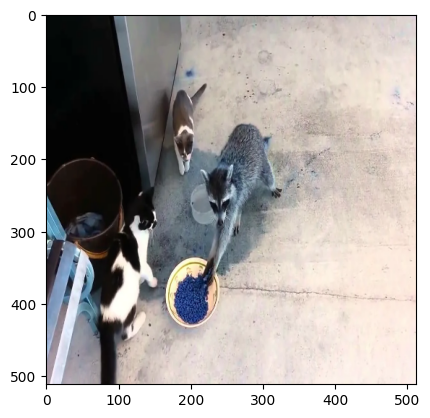

array([[  4,   4,   4, ..., 219, 216, 212],
       [  4,   4,   4, ..., 220, 218, 215],
       [  4,   4,   4, ..., 220, 220, 219],
       ...,
       [170, 169, 168, ..., 253, 253, 253],
       [170, 169, 168, ..., 253, 253, 253],
       [171, 170, 169, ..., 253, 253, 253]], dtype=uint8)

array([[  9,   9,   9, ..., 208, 204, 200],
       [  9,   9,   9, ..., 209, 205, 203],
       [  9,   9,   9, ..., 209, 208, 207],
       ...,
       [157, 156, 155, ..., 242, 240, 239],
       [157, 156, 155, ..., 242, 240, 239],
       [158, 157, 156, ..., 242, 240, 239]], dtype=uint8)

array([[  8,   8,   8, ..., 221, 219, 216],
       [  8,   8,   8, ..., 222, 221, 219],
       [  8,   8,   8, ..., 222, 224, 223],
       ...,
       [168, 167, 166, ..., 235, 238, 241],
       [168, 167, 166, ..., 235, 238, 241],
       [169, 168, 167, ..., 235, 238, 241]], dtype=uint8)

In [2]:
for i, image in enumerate(images):
    # Получаем размеры изображения
    im, w, _ = image.shape
    display(f"Изображение {i+1}: {im}x{w}px")

    size = image.size
    display(size)

# Получение RGB
print("\n\n Получение RGB матрицы")
plt.imshow(image)
plt.show()

r, g, b = image.transpose((2, 0, 1))
display(r, g, b)

### Применение методов предобработки изображений   

Код включает несколько этапов предобработки изображений, таких как изменение размеров, цвета, оттенков и увеличение контраста.

Для чего производим предобработку?  

Для оптимизации и уменьшения вычислительных ззатрат. Для приведения всех изображений к ежиному виду для изучения и анализа. Также мы можем выравнить изображения, распределив интенсивность пикселей, улучшить контраст - всё это повысит качество модели для анализа.

На Mahotas


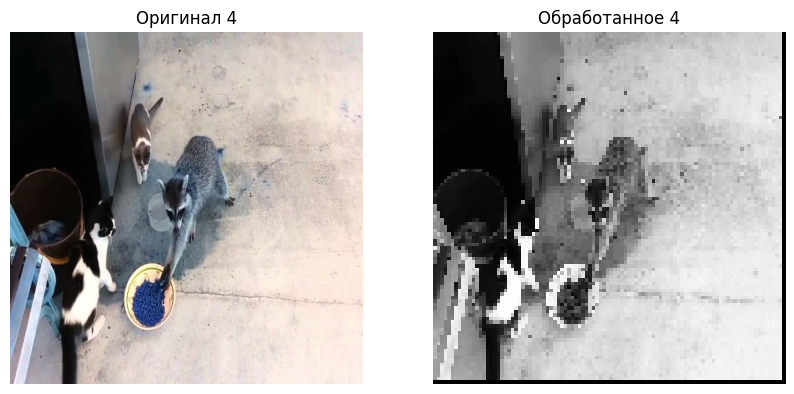

На OpenCV


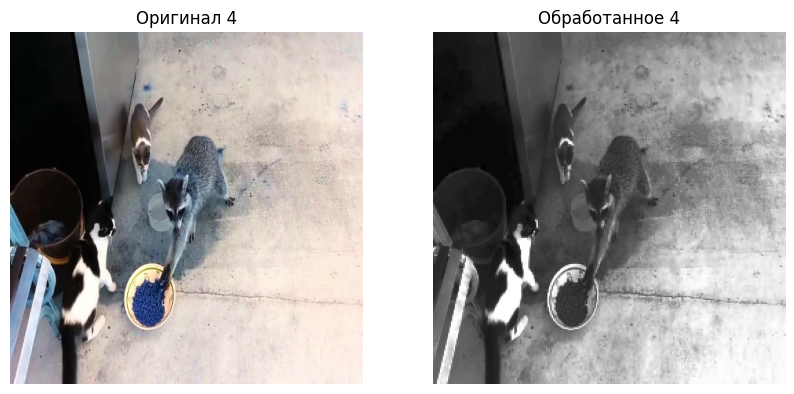

In [3]:
import mahotas as mh

# Функция предобработки изображений на библиотеке mahotas
def preprocess_images_on_mh(images):
    processed_images = []
    for image in images:
        # Изменение размеров
        image_resized = mh.resize.resize_rgb_to(image, (100, 100))

        # Увеличение контраста с помощью гистограммы. Преобразование в оттенки серого
        image_gray = mh.colors.rgb2gray(image_resized)

        # Растяжение контраста (замена mh.equalize)
        image_eq = mh.stretch(image_gray)

        processed_images.append(image_eq)

    return np.array(processed_images)


# Функция отображения оригинала и обработанного изображения
def display_image(original, processed, index):
    plt.figure(figsize=(10, 5))

    # Оригинальное изображение
    plt.subplot(1, 2, 1)
    plt.imshow(original[index])
    plt.title(f'Оригинал {index+1}')
    plt.axis('off')

    # Обработанное изображение
    plt.subplot(1, 2, 2)
    plt.imshow(processed[index], cmap='gray')
    plt.title(f'Обработанное {index+1}')
    plt.axis('off')

    plt.show()

print("На Mahotas")

# Применяем предобработку 
processed_images_on_mahotas = preprocess_images_on_mh(images)
display_image(images, processed_images_on_mahotas, i)


# Функция предобработки изображений на библиотеке CV2
def preprocess_images(images):
    processed_images = []
    for image in images:
        # Изменение размера
        image_resized = cv2.resize(image, (256, 256))

        # Преобразование в оттенки серого
        image_gray = cv2.cvtColor(image_resized, cv2.COLOR_BGR2GRAY)

        # Увеличим контраст с помощью выравнивания гистограммы
        image_eq = cv2.equalizeHist(image_gray)

        processed_images.append(image_eq)
    
    return np.array(processed_images)

print("На OpenCV")

# Применим предобработку
procesed_images = preprocess_images(images)
display_image(images, procesed_images, i)

### Работа с гаммой изображения и встроенные методы преобразования

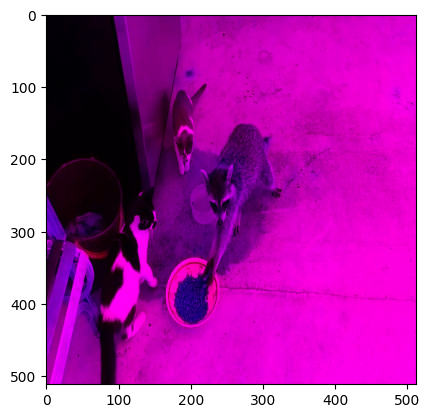

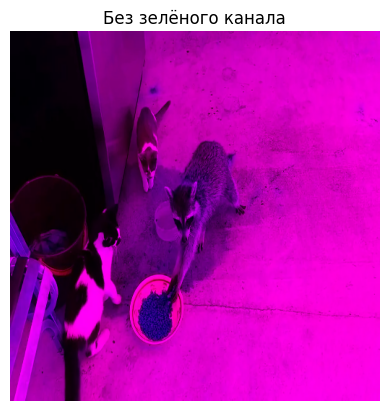

In [4]:
new_greenless_image = mh.as_rgb(r, g * 0, b)
plt.imshow(new_greenless_image)
plt.show()


# Удаляем зелёный канал
greenless_image = image.copy()
greenless_image[:, :, 1] = 0  # Обнуляем G-канал

# Отображение
plt.imshow(greenless_image)
plt.title("Без зелёного канала")
plt.axis("off")
plt.show()


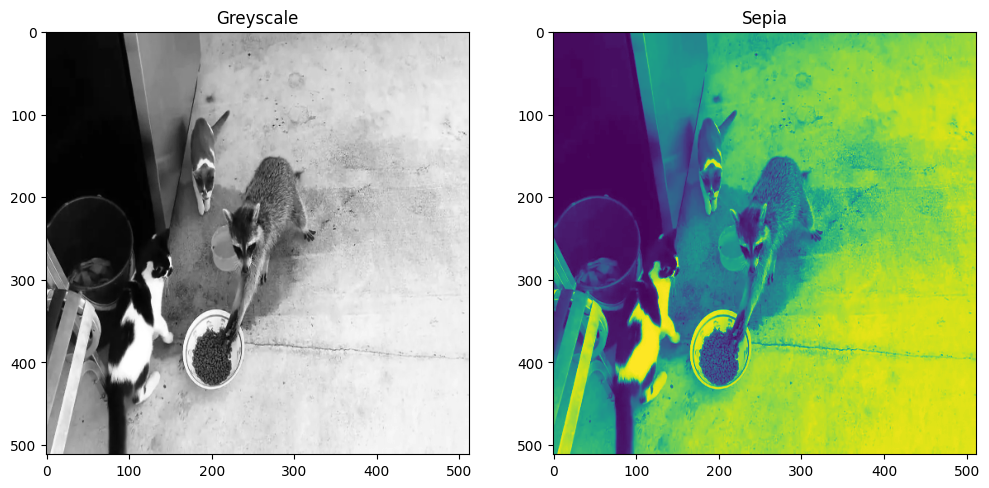

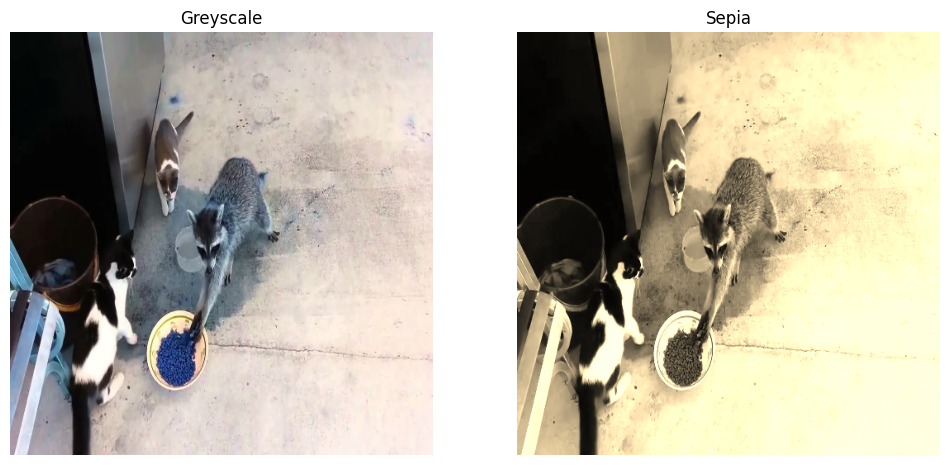

In [5]:
grey_image_mh = mh.colors.rgb2gray(image)

sepia_image = mh.colors.rgb2gray(image)

fig, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].imshow(grey_image_mh, cmap="gray")
axes[0].set_title("Greyscale")
axes[1].imshow(sepia_image)
axes[1].set_title("Sepia")
plt.show()


# Матрица для эффекта сепии
sepia_filter = np.array([[0.393, 0.769, 0.189],
                         [0.349, 0.686, 0.168],
                         [0.272, 0.534, 0.131]])

# Применение фильтра
sepia_image = cv2.transform(image.astype(np.float32) / 255, sepia_filter)
sepia_image = np.clip(sepia_image * 255, 0, 255).astype(np.uint8)  # Ограничиваем диапазон

fig, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].imshow(image, cmap="gray")
axes[0].set_title("Greyscale")
axes[0].axis("off")
axes[1].imshow(sepia_image)
axes[1].set_title("Sepia")
axes[1].axis("off")
plt.show()


### Фильтрация. Продолжим предобработку изображений  

**Удаление шумов**  
Обработку шумов успешно выполняет метод Гаусса (размытие Гаусса). Размытие по Гауссу используется для сглаживания изображения и удаления шумов. Применяется **к изображению Гауссово ядро, что позволяет уменьшить высокочастотные шумы (обычно используется размер ядра, как ширина и высота, а 0 - это стандартное отклонение от оси X и вычисляется автоматически).  

**Резкость изображения**  
Резкость можно повысить с помощью ядра, путём применения фильтра, который усиливает высокочастотные компоненты изображения. Это можно сделать с помощью свёртки с ядром. kernel — ядро для свёртки, -1 — глубина выходного изображения (такая же, как у исходного).  

**Границы изображения путём Canny**  
Определим границы с использованием алгоритма Canny  
Алгоритм Canny используется для обнаружения границ на изображении. Он включает в себя несколько этапов: подавление шумов, вычисление градиента, подавление не-максимумов и гистерезис. В нашем случае: 100 — нижний порог для гистерезиса, 200 — верхний порог для гистерезиса.  

*Подавление не-максимумов* — это этап, на котором удаляются пиксели, которые не являются локальными максимумами в направлении градиента(вектора, указывающего направление наибольшего изменения интенсивности). Это позволяет сделать границы более тонкими и точными. Для каждого пикселя сравнивается его значение градиента с значениями градиента соседних пикселей в направлении градиента. Если текущий пиксель не является локальным максимумом (т.е. его значение градиента меньше, чем у соседей), он подавляется (обнуляется).  

**Гистерезис** — это этап, на котором окончательно определяются границы с использованием двух пороговых значений: нижнего и верхнего. Это позволяет отфильтровать слабые границы и оставить только значимые.  

Верхний порог: Пиксели с градиентом выше этого порога считаются сильными границами.  

Нижний порог: Пиксели с градиентом ниже этого порога отбрасываются.  

Пиксели с градиентом между порогами считаются слабыми границами.  

Фильтрация будет заключаться в том, что все пиксели изображения преобразуем по размерам, затем добавим резкость, определим границы, сильные границы изображения сохраним и зафиксируем, далее слабые границы сохраним в случае, если они связаны с сильными границыми. Преобразуем изображени в оттенки серого, удалим зелёный канал, применим гистограмму для контраста и обработаем все изображения.

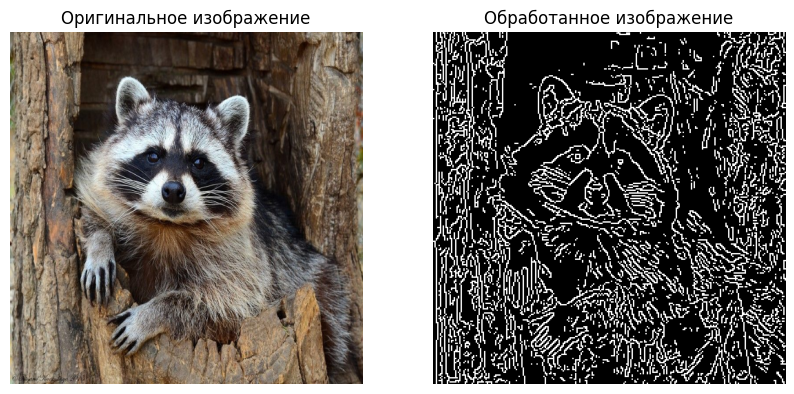

In [6]:
def apply_filters(image):
    # Удалим шумы в картинке
    image_blur = cv2.GaussianBlur(image, (5, 5), 0)

    # Повысим резкость изображения
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    image_sharp = cv2.filter2D(image_blur, -1, kernel)

    # Определим границы
    image_edges = cv2.Canny(image_sharp, 200, 200)

    return image_edges

def preprocess_images(images):
    process_images = []
    for image in images:
        # Изменение размера
        image_resized = cv2.resize(image, (256, 256))

        # Преобразование в оттенки серого
        image_gray = cv2.cvtColor(image_resized, cv2.COLOR_BGR2GRAY)

        # Удаляем зелёный канал
        greenless_image = image_gray.copy()
        greenless_image[:, 1] = 0  # Обнуляем G-канал

        # Увеличим контраст с помощью гистограммы
        image_eq = cv2.equalizeHist(greenless_image)
        process_images.append(image_eq)
    return np.array(process_images)


# Выполнение предобработки изображений
processed_images = preprocess_images(images)

# Применяем фильтры к каждому изображению
filtered_images = np.array([apply_filters(image) for image in processed_images])

# Функция для отображения одного изображения
def display_single_image(original, processed, index):
    plt.figure(figsize=(10, 5))
    
    # Отображение оригинального изображения
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original[index], cv2.COLOR_BGR2RGB))
    plt.title('Оригинальное изображение')
    plt.axis('off')

    # Отображение обработанного изображения
    plt.subplot(1, 2, 2)
    plt.imshow(processed[index], cmap='gray')
    plt.title('Обработанное изображение')
    plt.axis('off')

    plt.show()

index = 1
display_single_image(images, filtered_images, index)

### Извлекаем признаки из изображения   

Признаки могут быть текстурными, цветовыми или комбинированными. Извлечём цветовые признаки (среднее значение, стандартное отклонение, гистограмму) и текстурные признаки (характеристики Харалика).  

**Извлечение цветовых признаков**  
Среднее значение и стандартное отклонение для каждого цветового канала (например, R, G, B) дают информацию о распределении интенсивности пикселей. Гистограмма показывает распределение интенсивности пикселей для каждого канала.  

**Извлечение текстурных признаков**  
*Характеристики Харалика* — набор статистических метрик, которые описывают текстуру изображения. Они вычисляются на основе матрицы совместной встречаемости уровней серого (GLCM, Gray-Level Co-occurrence Matrix).  

Алгоритм заключается в следующем: преобразовываем изображение в оттенки серого, вычисляем GLCM, извлекаем характеристики Харалика (контраст, энергия, энтропия, однородность).

In [ ]:
import os
import cv2
import numpy as np
import mahotas
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

def load_images_from_folder(main_folder):
    images = []
    filenames = []

    # Проверяем, существует ли основная папка
    if not os.path.exists(main_folder):
        raise FileNotFoundError(f"Папка {main_folder} не найдена")

    # Рекурсивно проходим по всем подпапкам
    for root, _, files in os.walk(main_folder):
        class_name = os.path.basename(root)  # Используем название папки как метку класса

        for filename in files:
            file_path = os.path.join(root, filename)

            # Проверяем расширение файла
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                image = cv2.imread(file_path)
                if image is not None:
                    image = cv2.resize(image, (512, 512))
                    images.append(image)
                    filenames.append(class_name)

    return images, filenames

def extract_color_features(image):
    color_features = []

    if len(image.shape) == 2:
        # Чёрно-белое изображение
        color_features.extend([
            np.mean(image), np.std(image),
            *cv2.calcHist([image], [0], None, [256], [0, 256]).flatten()
        ])
    else:
        # Цветное изображение
        for channel in range(image.shape[2]):
            channel_image = image[:, :, channel]
            color_features.extend([
                np.mean(channel_image), np.std(channel_image),
                *cv2.calcHist([channel_image], [0], None, [256], [0, 256]).flatten()
            ])

    return np.array(color_features)

def extract_texture_features(image):
    # Перевод в оттенки серого
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    """Вычисляем  текстурные признаки Харалика - пространственные отношения между пикселями 
    (усредняются результаты по направлениям). Один вектор признаков получаем"""
    haralick_features = mahotas.features.haralick(gray_image).mean(axis=0)
    return haralick_features

def extract_features(images):
    features = []
    for image in images:
        # Извлечение цветных признаков
        color_features = extract_color_features(image)
        # Извлечение текстурных признаков
        texture_features = extract_texture_features(image)
        # Горизонтальное объединение в один вектор и сохраняем вектора в список и возвращаем массив NumPy.
        combined_features = np.hstack([color_features, texture_features])
        features.append(combined_features)
    return np.array(features)

# Путь к папке с изображениями (должна находиться рядом со скриптом)
data_folder = "./static/images/testing"

# Загрузка изображений
images, filenames = load_images_from_folder(data_folder)

if len(images) == 0:
    raise ValueError("Не загружено ни одного изображения. Проверьте папку images и наличие картинок")

print(f"Загружено {len(images)} изображений из {len(np.unique(filenames))} классов")

# Извлечение признаков
features_array = extract_features(images)
filenames_array = np.array(filenames)

if len(np.unique(filenames_array)) < 2:
    raise ValueError("Для классификации нужно как минимум 2 класса")

# Разделение данных
X_train, X_test, y_train, y_test = train_test_split(features_array, filenames_array, test_size=0.2, stratify=filenames_array, random_state=42)

# Обучение модели
clf = SVC(kernel='linear')
clf.fit(X_train, y_train)

# Оценка модели
y_pred = clf.predict(X_test)

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))
print("\nОтчёт о классификации:")
print(classification_report(y_test, y_pred, zero_division=1))


Загружено 12 изображений из 3 классов

Confusion Matrix:
[[1 0 0]
 [1 0 0]
 [1 0 0]]

Отчёт о классификации:
              precision    recall  f1-score   support

        test       0.33      1.00      0.50         1
     testing       1.00      0.00      0.00         1
       train       1.00      0.00      0.00         1

    accuracy                           0.33         3
   macro avg       0.78      0.33      0.17         3
weighted avg       0.78      0.33      0.17         3



Сильный дисбаланс предсказаний — модель предсказывает только один класс (0). Размер выборки: всего 3 объекта в тесте — слишком мало для оценки. Precision и Recall у второго и третьего классов = 0.0, т.к. модель не делает предсказаний для этих классов.

### Обучим модель  

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix

folder = "./static/images/testing"
images, labels = load_images_from_folder(folder)
features_array = extract_features(images)

# Преобразуем в массив Numpy
filenames_array = np.array(filenames)

if len(np.unique(filenames_array)) < 2:
    raise ValueError("Для классификации нужно как минимум 2 класса")

# Разделю выборки на тренировочную и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(features_array, filenames_array, test_size = 0.2, stratify=filenames_array, random_state=42)

# Стандартизируем данные
scaler = StandardScaler()
x_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Обучим классификатор SVM (метод классификации)
model = SVC(kernel='linear', C=1)
model.fit(X_train, y_train)

# Предсказание на тестовых данных
y_pred = model.predict(X_test)

# Оценки и метрики качества
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[1 0 0]
 [1 0 0]
 [1 0 0]]
              precision    recall  f1-score   support

        test       0.33      1.00      0.50         1
     testing       0.00      0.00      0.00         1
       train       0.00      0.00      0.00         1

    accuracy                           0.33         3
   macro avg       0.11      0.33      0.17         3
weighted avg       0.11      0.33      0.17         3



e:\MII\laboratory\mai\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
e:\MII\laboratory\mai\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
e:\MII\laboratory\mai\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Все предсказания y_pred оказались одинаковыми (скорее всего, одной меткой). Всё это из-за маленького датасета.

### Попробуем решить проблему Аугментации данных для 10 случайных изображений  

In [ ]:
import numpy as np
import cv2
import mahotas
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix

def load_and_prepare_data():
    # Создаём тестовые данные (4 изображения 256x256)
    processed_images = np.random.randint(0, 256, (4, 128, 128), dtype=np.uint8)
    # 12 меток для 4 изображений
    labels = np.array([0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3])
    
    # Преобразуем в 1 метку на изображение (берем первую для каждого)
    unique_labels = []
    unique_images = []
    for i in range(0, len(labels), 3):
        unique_images.append(processed_images[i//3])
        unique_labels.append(labels[i])
    
    return np.array(unique_images), np.array(unique_labels)

def augment_data(images, labels, augment_count=40):
    images = np.array(images)
    labels = np.array(labels)
    
    if len(images) != len(labels):
        raise ValueError(f"Несоответствие размеров: {len(images)} изображений и {len(labels)} меток")
    
    # Создаём объект ImageDataGenerator для аугментации
    datagen = ImageDataGenerator(
        rotation_range=10, # Поворот изображения
        width_shift_range=0.1, # Сдвиг изображения по горизонтали и затем по вертикали
        height_shift_range=0.1,
        shear_range=0.1, # Косая деформация (сдвиг)
        zoom_range=0.1, # Увеличение/уменьшение изображения
        horizontal_flip=True,   # Отражение по горизонтали и затем заполнение новых пикселей
        fill_mode='nearest'
    )

    augmented_images = []
    augmented_labels = []

    for image, label in zip(images, labels):
        # Каждое изображение расширяем размерностью
        image = np.expand_dims(image, axis=-1) if len(image.shape) == 2 else image
        image = np.expand_dims(image, axis=0)  # Добавляем batch-измерение
        
        # Генерация 10 аугментированных вариантов
        for _ in range(augment_count):
            augmented_image = next(datagen.flow(image, batch_size=1))[0].astype(np.uint8)
            augmented_images.append(augmented_image.squeeze())
            augmented_labels.append(label)

    return np.array(augmented_images), np.array(augmented_labels)

def extract_features(images):
    # Извлечение признаков с проверками
    features = []
    for image in images:
        # Цветовые признаки

        channels = [image] if len (image.shape) == 2 else [image[:, :, i] for i in range(image.shape[2])]
        
        color_features = []
        for channel in range(image.shape[2]):
            channel_image = image[:, :, channel]
            color_features.extend([np.mean(channel_image), np.std(channel_image),
                *cv2.calcHist([channel_image], [0], None, [256], [0, 256]).flatten()
            ])
        
        # Текстура
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if image.shape[2] == 3 else image[:, :, 0]
        texture_features = mahotas.features.haralick(gray).mean(axis=0)
        
        features.append(np.hstack([color_features, texture_features]))
    
    return np.array(features)


def extract_texture_features(image):
    # Если изображение уже чёрно-белое (одноканальное), преобразовывать не нужно
    if len(image.shape) == 2 or image.shape[2] == 1:
        gray_image = image if len(image.shape) == 2 else image[:, :, 0]
    else:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    return mahotas.features.haralick(gray_image).mean(axis=0)


def extract_features(images):
    # Извлекает признаки из всех изображений.
    return np.array([np.hstack([extract_color_features(image), extract_texture_features(image)]) for image in images])


# Основной поток выполнения
try:
    # 1. Загрузка данных
    processed_images, labels = load_and_prepare_data()
    print(f"Загружено {len(processed_images)} изображений и {len(labels)} меток")
    
    # 2. Аугментация
    augmented_images, augmented_labels = augment_data(processed_images, labels)
    print(f"Создано {len(augmented_images)} аугментированных изображений")
    
    # 3. Преобразование в RGB (если нужно)
    if augmented_images.shape[-1] == 1:
        augmented_images = np.repeat(augmented_images, 3, axis=-1)
    
    # 4. Извлечение признаков
    features = extract_features(augmented_images)
    print(f"Извлечено {len(features)} наборов признаков")
    
    # 5. Разделение данных
    X_train, X_test, y_train, y_test = train_test_split(
        features, augmented_labels, test_size=0.2, random_state=42
    )
    print(f"Обучающая выборка: {len(X_train)}, тестовая: {len(X_test)}")
    
    # 6. Масштабирование
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)
    
    # 7. Обучение модели (пример)
    from sklearn.ensemble import RandomForestClassifier
    model = RandomForestClassifier()
    model.fit(X_train, y_train)
    
    # 8. Оценка
    y_pred = model.predict(X_test)
    print(classification_report(y_test, y_pred))
    # Матрица ошибок
    print(confusion_matrix(y_test, y_pred))

except Exception as e:
    print(f"Ошибка: {str(e)}")

Загружено 4 изображений и 4 меток
Создано 160 аугментированных изображений
Извлечено 160 наборов признаков
Обучающая выборка: 128, тестовая: 32
              precision    recall  f1-score   support

           0       0.83      0.50      0.62        10
           1       0.57      0.67      0.62         6
           2       0.80      0.89      0.84         9
           3       0.44      0.57      0.50         7

    accuracy                           0.66        32
   macro avg       0.66      0.66      0.65        32
weighted avg       0.69      0.66      0.66        32

[[5 1 2 2]
 [0 4 0 2]
 [0 0 8 1]
 [1 2 0 4]]


При аугментации были обработаны 160 изображений. Точность модели составила 66% - средний показатель. Модель правильно классифицирует 66% примеров. Чтобы улучшить модель можно увеличить данные, либо использовать более сложные методы. Баланс между классами стал лучше после аугментации. Модель предсказывает все классы, хоть и не идеально. F1-score 0.5, а у некоторых и выше, доходит до 0.8, что говорит о хорошем предсказании. Перекос по precision/recall в некоторых классах говорит о сложности различения между ними.

## Приступим к работе с рентгеновскими изображениями

Начинаем поиск изображений в: ./static/images/X-ray
Найдено изображение: ./static/images/X-ray\test\Covid\0100.jpeg
Найдено изображение: ./static/images/X-ray\test\Covid\0102.jpeg
Найдено изображение: ./static/images/X-ray\test\Covid\0105.png
Найдено изображение: ./static/images/X-ray\test\Covid\0106.jpeg
Найдено изображение: ./static/images/X-ray\test\Covid\0108.jpeg
Найдено изображение: ./static/images/X-ray\test\Covid\0111.jpg
Найдено изображение: ./static/images/X-ray\test\Covid\0112.jpg
Найдено изображение: ./static/images/X-ray\test\Covid\0113.jpg
Найдено изображение: ./static/images/X-ray\test\Covid\0115.jpeg
Найдено изображение: ./static/images/X-ray\test\Covid\0118.jpeg
Найдено изображение: ./static/images/X-ray\test\Covid\0119.jpeg
Найдено изображение: ./static/images/X-ray\test\Covid\0120.jpg
Найдено изображение: ./static/images/X-ray\test\Covid\094.png
Найдено изображение: ./static/images/X-ray\test\Covid\096.png
Найдено изображение: ./static/images/X-ray\test\Covid\098.jpe

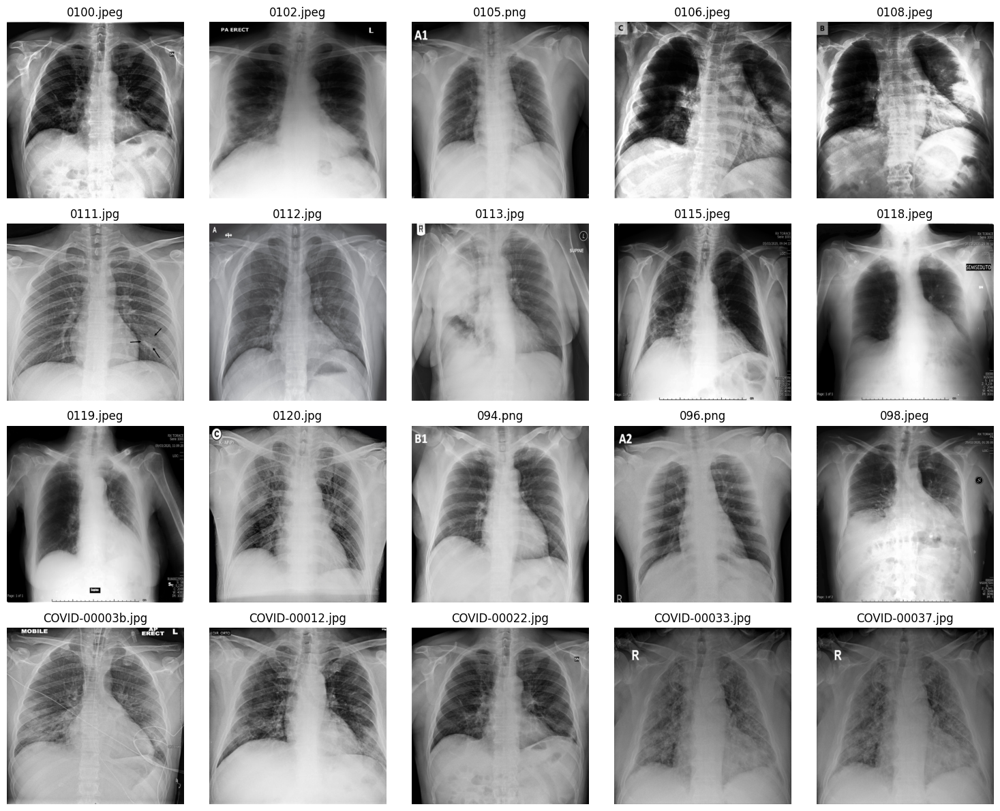


Информация о первом изображении:
Размер: 512x512
Каналы: 3
Тип данных: uint8
Диапазон значений: 0-255


In [10]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Функция для загрузки изображений с OpenCV
def load_images_Xray(root_folder, target_size=(512, 512), allowed_extensions=("jpg", "jpeg", "png", "bmp", "gif")):
    images = []
    filepaths = []
    
    if not os.path.exists(root_folder):
        raise FileNotFoundError(f"Папка {root_folder} не найдена.")
    
    print(f"Начинаем поиск изображений в: {root_folder}")
    
    for root, _, files in os.walk(root_folder):
        for filename in sorted(files):
            if filename.lower().endswith(allowed_extensions):
                filepath = os.path.join(root, filename)
                print(f"Найдено изображение: {filepath}")
                
                try:
                    # Загружаем изображение с OpenCV
                    image = cv2.imread(filepath)
                    if image is None:
                        print(f"Ошибка загрузки: {filepath}")
                        continue

                    # Изменение размера с сохранением пропорций
                    h, w = image.shape[:2]
                    if h != target_size[0] or w != target_size[1]:
                        image = cv2.resize(image, target_size, interpolation=cv2.INTER_AREA)
                    
                    # Добавляем изображение в список
                    images.append(image)
                    filepaths.append(filepath)
                except Exception as e:
                    print(f"Ошибка при обработке {filepath}: {str(e)}")
    
    return images, filepaths

def display_images(images, filepaths, max_images=20):
    # Отображает изображения в виде сетки
    if not images:
        print("Нет изображений для отображения.")
        return
    
    count = min(max_images, len(images))
    cols = 5
    rows = (count + cols - 1) // cols  # Округление вверх
    
    plt.figure(figsize=(15, 3 * rows))
    for i in range(count):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(os.path.basename(filepaths[i]))
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Указываем путь к папке с изображениями
folder_path = "./static/images/X-ray"  # Замените на ваш путь
    
try:
    images, filepaths = load_images_Xray(folder_path)
    print(f"Загружено {len(images)} изображений.")
        
    display_images(images, filepaths)
        
    # Дополнительная информация
    if images:
        sample = images[0]
        print(f"\nИнформация о первом изображении:")
        print(f"Размер: {sample.shape[1]}x{sample.shape[0]}")
        print(f"Каналы: {sample.shape[2] if len(sample.shape) > 2 else 1}")
        print(f"Тип данных: {sample.dtype}")
        print(f"Диапазон значений: {np.min(sample)}-{np.max(sample)}")
except Exception as e:
    print(f"Произошла ошибка: {str(e)}")


Получили изображения из директории и применили некоторые преобразования.

## Реализуем предобработку изображений  

Обработка изображения будет заключаться в изменение размера, цвета в серый, отключение зелёного канала, нормализация изображения, сепия. Затем применим Гауссовское размытие, гистограмму, Canny, фильтрация с использованием метода Отсу, бинаризация, сегментация изображения, выделение объектов по маске.

In [11]:
from skimage import color, exposure, feature, filters, measure, morphology
from sklearn.cluster import KMeans
from skimage.feature import canny
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Функция для предварительной обработки изображений
def preprocess_images(images, target_size=(256, 256)):
    preprocessed_images = []
    resized_images = []
    no_green_images = []
    sepia_images = []
    smoothed_images = []  # Для промежуточных результатов
    normalized_images = []  # Для нормализованных изображений
    hist_images = []
    binary_images = []
    segmented_kmeans_images = []
    masked_objects_images = []
    gauss_images = []

    for image in images:
        # Изменяем размер изображения
        resized_image = cv2.resize(image, target_size, interpolation=cv2.INTER_AREA)
        resized_images.append(resized_image)

        # Преобразуем из BGR в RGB, если используем OpenCV (так как OpenCV использует BGR)
        if resized_image.shape[-1] == 3:
            image = cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB)
        else:
            image = resized_image  # Если уже в градациях серого

        # Переводим изображение в градации серого (нормализуем перед конвертацией)
        gray_image = color.rgb2gray(resized_image.astype(np.float32) / 255.0)  # 2D изображение в градациях серого

        # Нормализуем изображение (переводим в градации серого и нормализуем значения)
        normalized_images.append(gray_image)

        # Применяем сепию
        sepia_image = mh.colors.rgb2sepia(resized_image)
        sepia_images.append(sepia_image)

        # Убираем зеленый канал
        if len(sepia_image.shape) == 3:  # Проверяем, является ли изображение цветным
            r, g, b = sepia_image[:, :, 0], sepia_image[:, :, 1], sepia_image[:, :, 2]
            no_green_image = np.stack([r, np.zeros_like(g), b], axis=-1)
        else:  # Если изображение в градациях серого, просто оставляем его
            no_green_image = sepia_image
        no_green_images.append(no_green_image)

        # Гистограммная эквализация для улучшения контраста
        hist_equalized = exposure.equalize_hist(no_green_image)
        hist_images.append(hist_equalized)

        gauss_image = cv2.GaussianBlur(resized_image, (5, 5), 0)
        gauss_images.append(gauss_image)
        
        # Гауссово размытие для уменьшения шума
        smoothed_image = mh.gaussian_filter(hist_equalized, 3)
        smoothed_images.append(smoothed_image)  # Сохраняем промежуточный результат

        # Убедимся, что смазанное изображение 2D перед передачей в Canny
        if smoothed_image.ndim == 3:
            smoothed_image = smoothed_image[:, :, 0]  # Берем один канал, если изображение 3D (RGB)

        # Обнаруживаем края с помощью Canny перед пороговой фильтрацией
        edges = canny(smoothed_image, sigma=1)  # Убедитесь, что изображение 2D
        
        # Добавляем к списку результатов
        preprocessed_images.append(edges)

        # Пороговая фильтрация с использованием метода Отсу
        threshold = filters.threshold_otsu(smoothed_image)
        binary_image = smoothed_image > threshold
        binary_images.append(binary_image)
        
        # K-Means сегментация (2 кластера)
        img_for_kmeans = smoothed_image  # Можно использовать оригинал или smoothed_image
        pixels = img_for_kmeans.reshape(-1, 1)
        kmeans = KMeans(n_clusters=2, random_state=42).fit(pixels)
        segmented_kmeans = kmeans.labels_.reshape(img_for_kmeans.shape)
        segmented_kmeans_images.append(segmented_kmeans)

        # Выделение объектов по маске
        mask = binary_image.copy()
        mask = morphology.remove_small_objects(mask, min_size=50)
        mask = morphology.remove_small_holes(mask, area_threshold=50)
        labeled = measure.label(mask)
        masked_objects = color.label2rgb(labeled, image=gray_image, bg_label=0)
        masked_objects_images.append(masked_objects)        

    return (np.array(preprocessed_images), np.array(gauss_images), np.array(sepia_images), np.array(normalized_images), 
            np.array(smoothed_images), np.array(binary_images), np.array(segmented_kmeans_images), np.array(masked_objects_images))

e:\MII\laboratory\mai\Lib\site-packages\skimage\_shared\utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)
e:\MII\laboratory\mai\Lib\site-packages\skimage\_shared\utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)
e:\MII\laboratory\mai\Lib\site-packages\skimage\_shared\utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)
e:\MII\laboratory\mai\Lib\site-packages\skimage\_shared\utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image.

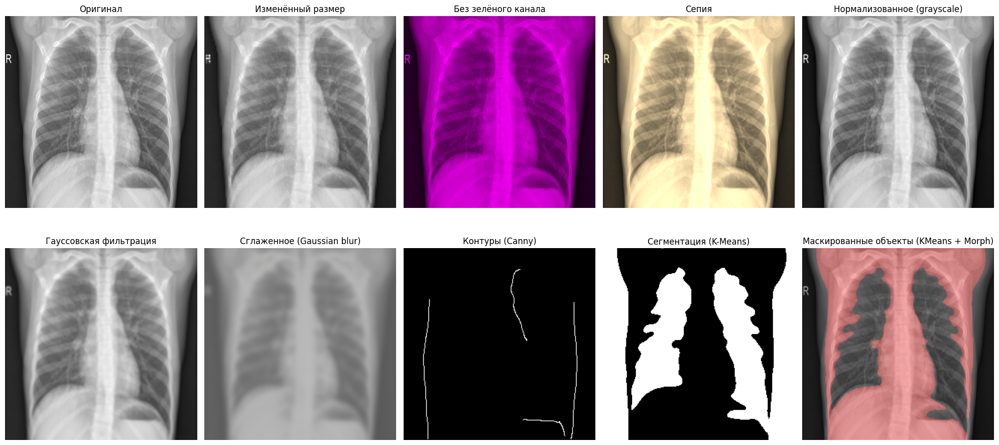

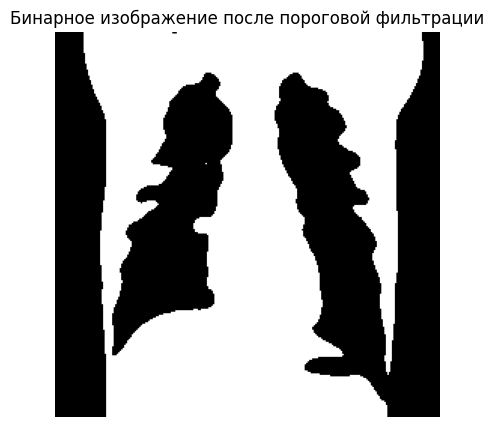

In [12]:
# Получаем предварительно обработанные изображения
(processed_images, gauss_images, sepia_images,  normalized_images, smoothed_images, 
 binary_images, segmented_kmeans_images, masked_objects_images) = preprocess_images(images)

# Выберите индекс изображения для демонстрации
index = 35

# Визуализация всех этапов обработки
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

# Оригинальное изображение
axes[0, 0].imshow(images[index])
axes[0, 0].set_title('Оригинал')
axes[0, 0].axis('off')

# Изменённый размер
resized_img = cv2.resize(images[index], (128, 128))
axes[0, 1].imshow(resized_img)
axes[0, 1].set_title('Изменённый размер')
axes[0, 1].axis('off')

# Без зелёного канала
r, g, b = images[index][:, :, 0], images[index][:, :, 1], images[index][:, :, 2]
no_green = np.stack([r, np.zeros_like(g), b], axis=-1).astype(np.uint8)
axes[0, 2].imshow(no_green)
axes[0, 2].set_title('Без зелёного канала')
axes[0, 2].axis('off')

# Сепия
axes[0, 3].imshow(sepia_images[index])
axes[0, 3].set_title('Сепия')
axes[0, 3].axis('off')

# Нормализованное изображение (градации серого)
axes[0, 4].imshow(normalized_images[index], cmap='gray')
axes[0, 4].set_title('Нормализованное (grayscale)')
axes[0, 4].axis('off')

# Гауссовская фильтрация
axes[1, 0].imshow(gauss_images[index])
axes[1, 0].set_title('Гауссовская фильтрация')
axes[1, 0].axis('off')

# Смазанное изображение (гауссов фильтр)
axes[1, 1].imshow(smoothed_images[index], cmap='gray')
axes[1, 1].set_title('Сглаженное (Gaussian blur)')
axes[1, 1].axis('off')

# Контуры после Canny
axes[1, 2].imshow(processed_images[index], cmap='gray')
axes[1, 2].set_title('Контуры (Canny)')
axes[1, 2].axis('off')

# K-Means сегментация (если сохранялась как бинарная маска)
axes[1, 3].imshow(segmented_kmeans_images[index], cmap='gray')
axes[1, 3].set_title('Сегментация (K-Means)')
axes[1, 3].axis('off')

# Маскированные объекты (например, цветные объекты на чёрном фоне)
axes[1, 4].imshow(masked_objects_images[index])
axes[1, 4].set_title('Маскированные объекты (KMeans + Morph)')
axes[1, 4].axis('off')

plt.tight_layout()
plt.show()

# Обработка бинарного изображения (визуализация отдельно)
if isinstance(binary_images, list):
    binary_images = np.array(binary_images)

plt.figure(figsize=(5, 5))

if binary_images.ndim == 3:  # Пакет изображений
    plt.imshow(binary_images[index], cmap='gray')
elif binary_images.ndim == 2:  # Одно изображение
    plt.imshow(binary_images, cmap='gray')
else:
    print("Ошибка: binary_images имеет неправильную форму:", binary_images.shape)

plt.title('Бинарное изображение после пороговой фильтрации')
plt.axis('off')
plt.show()


## Извлечение признаков

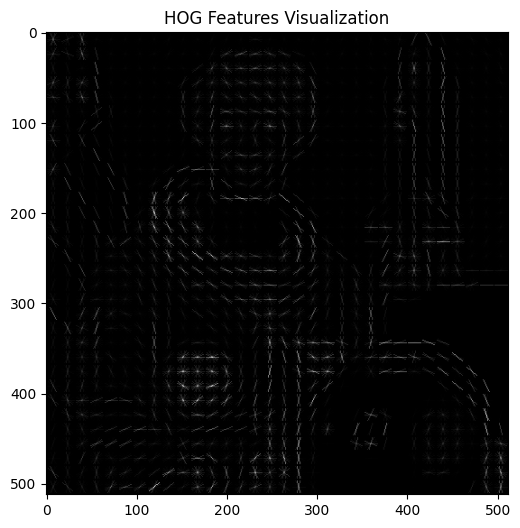

In [13]:
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import color, exposure

# Функция для извлечения признаков HOG
def extract_hog_features(processed_images):
    hog_features = []
    hog_images = []  # Для хранения изображений HOG для визуализации

    for image in processed_images:
        # Преобразуем в градации серого (если изображение цветное)
        if len(image.shape) == 3:
            image = color.rgb2gray(image)

        # Вычисляем HOG признаки     
        features, hog_image = hog(image, orientations=9, pixels_per_cell=(16, 16),
                                  cells_per_block=(2, 2), visualize=True, channel_axis=None)

        # Нормализуем изображение HOG для визуализации
        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

        # Добавляем признаки в список
        hog_features.append(features)
        hog_images.append(hog_image_rescaled)
    
    return np.array(hog_features, dtype=object), hog_images  # Возвращаем и признаки, и изображения HOG

# Пример загрузки изображения
from skimage import data

image = data.astronaut()  # Цветное изображение

# Запускаем функцию
features, hog_images = extract_hog_features([image])

# Визуализация HOG изображения
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
ax.imshow(hog_images[0], cmap='gray')  # Показываем HOG изображение, а не вектор признаков
ax.set_title("HOG Features Visualization")
plt.show()

In [14]:
from imblearn.over_sampling import SMOTE

# Применяем SMOTE для увеличения меньшего класса
print("Количество классов в y_train:", np.bincount(y_train))

# Использование SMOTE только если есть два класса
if len(np.unique(y_train)) > 1:
    smote = SMOTE(sampling_strategy='auto', random_state=42)
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)
else:
    print("Недостаточно классов в y_train для применения SMOTE")

# Обучаем модель на сбалансированных данных
model.fit(X_train_resampled, y_train_resampled)

# Предсказание
y_pred = model.predict(X_test)

Количество классов в y_train: [30 34 31 33]


## Глубокое обучение на основе TensorFlow

In [15]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib.image import imread
import os
from pathlib import Path
import numpy as np
import pandas as pd
import cv2

Ещё раз получим изображения  

One-hot encoding требуется для задач многоклассовой классификации. Для бинарной классификации можно обойтись без to_categorical, используя 1 нейрон с сигмоидой и binary_crossentropy.


In [16]:
# Пути к директориям
train_dir = "./static/images/X-ray/train"
val_dir = "./static/images/X-ray/test"
PIC_SIZE = 256
BATCH_SIZE = 8

# === Загружаем вручную ===
def load_and_label_images_from_directory(directory, target_size=(256, 256)):
    images = []
    labels = []
    class_names = sorted(os.listdir(directory))

    for class_name in class_names:
        class_path = os.path.join(directory, class_name)
        if not os.path.isdir(class_path):
            continue
        for file in sorted(os.listdir(class_path)):
            if file.lower().endswith((".jpg", ".png", ".jpeg", ".bmp")):
                file_path = os.path.join(class_path, file)
                img = cv2.imread(file_path)
                if img is None:
                    continue
                if img.shape[:2] != target_size:
                    img = cv2.resize(img, target_size)
                images.append(img)
                labels.append(class_name)

    return images, labels

# === Загружаем и предобрабатываем ===
train_images_raw, train_labels_raw = load_and_label_images_from_directory(train_dir, (PIC_SIZE, PIC_SIZE))
val_images_raw, val_labels_raw = load_and_label_images_from_directory(val_dir, (PIC_SIZE, PIC_SIZE))

_, gauss_train, *_= preprocess_images(train_images_raw, target_size=(PIC_SIZE, PIC_SIZE))
_, gauss_val, *_ = preprocess_images(val_images_raw, target_size=(PIC_SIZE, PIC_SIZE))

# Нормализуем изображения
train_images_tensor = gauss_train.astype(np.float32) / 255.0
val_images_tensor = gauss_val.astype(np.float32) / 255.0

# Кодируем метки. Целевая функция. Преобразование текстовых меток (категорий) в числа, в формат one-hot encoding для выполнения задачи классификации.
# One-hot encoding требуется для задач многоклассовой классификации. transorm и transform_fit используем для того, чтобы не переобучать нейросеть.
label_encoder = LabelEncoder()
train_labels_encoded = to_categorical(label_encoder.fit_transform(train_labels_raw))
val_labels_encoded = to_categorical(label_encoder.transform(val_labels_raw))

# Преобразуем изображения и метки в tf.data.Dataset
def convert_to_grayscale(image, label):
    image = tf.image.rgb_to_grayscale(image)
    return image, label

# Используем from_tensor_slices для передачи признаков и закодированных меток (целевой функции)
train_ds = tf.data.Dataset.from_tensor_slices((train_images_tensor, train_labels_encoded))
val_ds = tf.data.Dataset.from_tensor_slices((val_images_tensor, val_labels_encoded))

# Преобразуем изображения в оттенки серого
train_ds = train_ds.map(convert_to_grayscale)
val_ds = val_ds.map(convert_to_grayscale)

# Перемешиваем и объединяем в батчи
train_ds = train_ds.shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

print("Train dataset and validation dataset successfully prepared.")

print("Train shape:", train_images_tensor.shape)
print("Validation shape:", val_images_tensor.shape)
print("Классы:", label_encoder.classes_)

e:\MII\laboratory\mai\Lib\site-packages\skimage\_shared\utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)
e:\MII\laboratory\mai\Lib\site-packages\skimage\_shared\utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)
e:\MII\laboratory\mai\Lib\site-packages\skimage\_shared\utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)
e:\MII\laboratory\mai\Lib\site-packages\skimage\_shared\utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image.

Train dataset and validation dataset successfully prepared.
Train shape: (437, 256, 256, 3)
Validation shape: (457, 256, 256, 3)
Классы: ['Covid' 'Normal' 'Viral Pneumonia']


## Настройка гиперпараметров модели

### Архитектура нейронной сети  
Свёрточные блоки (Conv2D + BatchNorm + MaxPooling). Их задача выделить пространственные признаки. BatchNormalization ускоряет обучение, а Dropout борется с переобучением (0.2-0.5).  

Полносвязные слои анализируют извлечённые признаки, а выходной слой softmax для многоклассовой классификации.

In [17]:
model_simple = tf.keras.Sequential([
    # Первый свёрточный слой
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(PIC_SIZE, PIC_SIZE, 1), padding='same', kernel_initializer="he_normal"),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides=3, padding='same'),
    tf.keras.layers.Dropout(0.3),

    # Второй свёрточный слой
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', padding='same', kernel_initializer="he_normal"),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides=3, padding='same'),
    tf.keras.layers.Dropout(0.3),

    # Третий свёрточный слой
    tf.keras.layers.Conv2D(128, (3,3), activation='relu', padding='same', kernel_initializer="he_normal"),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides=3, padding='same'),
    tf.keras.layers.Dropout(0.3),
    
    # Полносвязный слой
    tf.keras.layers.GlobalAveragePooling2D(),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(64, activation='relu', kernel_initializer="he_normal"),
    tf.keras.layers.Dropout(0.5),
    
    tf.keras.layers.Dense(len(label_encoder.classes_), activation='softmax')
])

e:\MII\laboratory\mai\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


## Компиляция и обучение модели

In [18]:
model_simple.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
#categorical_crossentropy or binary_crossentropy (нужен мультикласс несколько классификаций)

# Теперь можно обучать модель
model_simple.fit(train_ds, validation_data=val_ds, epochs=50)

Epoch 1/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 13s 134ms/step - accuracy: 0.5013 - loss: 1.3703 - val_accuracy: 0.6324 - val_loss: 1.0454
Epoch 2/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - accuracy: 0.5957 - loss: 0.9742 - val_accuracy: 0.6324 - val_loss: 1.0397
Epoch 3/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 118ms/step - accuracy: 0.5687 - loss: 1.0088 - val_accuracy: 0.6324 - val_loss: 1.0402
Epoch 4/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - accuracy: 0.5993 - loss: 0.9673 - val_accuracy: 0.6324 - val_loss: 0.9869
Epoch 5/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - accuracy: 0.5962 - loss: 0.9322 - val_accuracy: 0.6214 - val_loss: 0.9066
Epoch 6/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 6s 116ms/step - accuracy: 0.5774 - loss: 0.9317 - val_accuracy: 0.6324 - val_loss: 0.8298
Epoch 7/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - accuracy: 0.6714 - loss: 0.8229 - val_accuracy: 0.6149 - val_loss: 0.8099
Epoch 8/50
55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 117ms/step - accuracy: 0.6553 - loss: 0.8301 - val_accuracy: 0

In [19]:
model_simple.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 86, 86, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 86, 86, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 86, 86, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 29, 29, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 303,371 (1.16 MB)

 Trainable params: 101,123 (395.01 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 202,248 (790.04 KB)

58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step


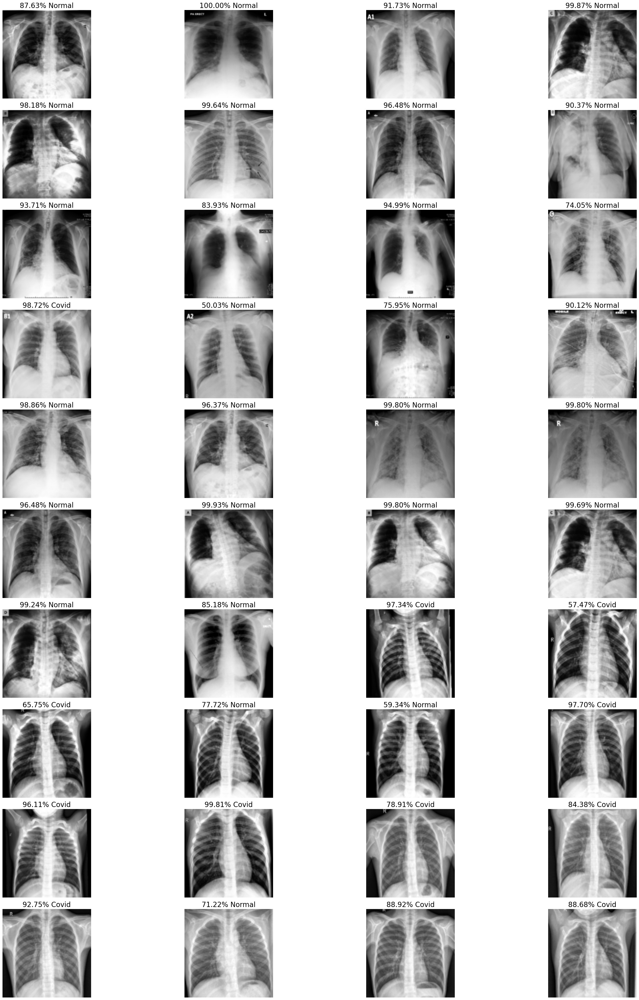

In [20]:
predict_label = []

# Получаем предсказания для всех изображений в val_ds
y_pred = model_simple.predict(val_ds, batch_size=BATCH_SIZE)

# Берём только первые 40 предсказаний
prediction = y_pred[0:40]

# Итератор по датасету
val_ds_iter = iter(val_ds)

# Собираем 40 изображений
images_list = []
while len(images_list) < 40:
    images, _ = next(val_ds_iter)
    for image in images:
        if len(images_list) >= 40:
            break
        images_list.append(image)

# Визуализация 10 строк по 4 изображения
plt.figure(figsize=(32, 40))  # увеличенный размер фигур

for i in range(40):
    plt.subplot(10, 4, i + 1)
    image = images_list[i].numpy().squeeze()

    # Проверка: grayscale или RGB
    if image.ndim == 2:
        plt.imshow(image, cmap='gray')
    else:
        plt.imshow(image)

    prob = prediction[i][1]
    label = f"{prob*100:.2f}% Covid" if prob > 0.5 else f"{(1 - prob)*100:.2f}% Normal"
    predict_label.append(label)
    plt.title(label, fontsize=20)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [21]:
# Оценка модели на обучающем наборе
train_loss, train_acc = model_simple.evaluate(train_ds)
print(f"Train Loss: {train_loss}, Train Accuracy: {train_acc}")

# Оценка модели на валидационном наборе
val_loss, val_acc = model_simple.evaluate(val_ds)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_acc}")


55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.9382 - loss: 0.1783
Train Loss: 0.18000654876232147, Train Accuracy: 0.9336384534835815
58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 28ms/step - accuracy: 0.8699 - loss: 0.3652
Validation Loss: 1.0087934732437134, Validation Accuracy: 0.7045952081680298


### Улучшение модели  
Увеличенная емкость модели. Добавлено больше фильтров (64 → 128 → 256). Увеличен размер полносвязного слоя (512 нейронов)  

Улучшенная регуляризация, добавлена L2-регуляризатор для всех слоев

In [22]:
deep_model = tf.keras.Sequential([
    # Первый свёрточный слой
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(PIC_SIZE, PIC_SIZE, 1), kernel_regularizer = tf.keras.regularizers.l2(0.00001), kernel_initializer = "he_normal", strides=1, padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides=2, padding="same"),
    tf.keras.layers.BatchNormalization(),

    # Второй свёрточный слой
    tf.keras.layers.Conv2D(64, (3,3), activation='relu', kernel_initializer = "he_normal", padding='same'),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides=2, padding='same'),
    tf.keras.layers.BatchNormalization(),

    # Третий свёрточный слой
    tf.keras.layers.Conv2D(128, (3,3), activation='relu', padding='same', kernel_initializer="he_normal"),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides=2, padding='same'),
    tf.keras.layers.BatchNormalization(),

    # Четвёртый свёрточный слой
    tf.keras.layers.Conv2D(256, (3,3), activation='relu', padding='same', kernel_initializer="he_normal"),
    tf.keras.layers.MaxPooling2D(pool_size=(2,2), strides=2, padding='same'),
    tf.keras.layers.BatchNormalization(),

    # Полносвязный слой
    tf.keras.layers.GlobalAveragePooling2D(),

    # tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dropout(0.4),

    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.6),

    tf.keras.layers.Dense(len(label_encoder.classes_), activation='softmax')
])

In [23]:
deep_model.compile(
    optimizer=tf.keras.optimizers.Nadam(learning_rate=0.001),
    loss=tf.keras.losses.CategoricalCrossentropy(),
    metrics=['acc']
)

history = deep_model.fit(
    train_ds,   
    epochs=20, 
    validation_data=val_ds)

print("Модель натренировалась")

Epoch 1/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 29s 372ms/step - acc: 0.6529 - loss: 0.7891 - val_acc: 0.6324 - val_loss: 2.3586
Epoch 2/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 20s 361ms/step - acc: 0.8380 - loss: 0.4336 - val_acc: 0.6368 - val_loss: 2.1896
Epoch 3/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 20s 362ms/step - acc: 0.8273 - loss: 0.4193 - val_acc: 0.0569 - val_loss: 5.8711
Epoch 4/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 20s 366ms/step - acc: 0.8209 - loss: 0.4575 - val_acc: 0.0569 - val_loss: 7.3623
Epoch 5/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 20s 370ms/step - acc: 0.8695 - loss: 0.3718 - val_acc: 0.6674 - val_loss: 2.4954
Epoch 6/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 20s 364ms/step - acc: 0.9179 - loss: 0.3149 - val_acc: 0.6433 - val_loss: 3.5217
Epoch 7/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 20s 369ms/step - acc: 0.8863 - loss: 0.2905 - val_acc: 0.6193 - val_loss: 3.1718
Epoch 8/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 19s 348ms/step - acc: 0.8814 - loss: 0.3242 - val_acc: 0.6783 - val_loss: 2.9991
Epoch 9/20
55/55 ━━━━━━━━━━━━━━━━━━━━ 15s 275ms/

In [24]:
deep_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 256, 256, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 3)              │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,764,108 (6.73 MB)

 Trainable params: 587,715 (2.24 MB)

 Non-trainable params: 960 (3.75 KB)

 Optimizer params: 1,175,433 (4.48 MB)

In [25]:
# Оценка модели на обучающем наборе
train_loss, train_acc = deep_model.evaluate(train_ds)
print(f"Train Loss: {train_loss}, Train Accuracy: {train_acc}")

# Оценка модели на валидационном наборе
val_loss, val_acc = deep_model.evaluate(val_ds)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_acc}")

55/55 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - acc: 0.9766 - loss: 0.1021
Train Loss: 0.11735031753778458, Train Accuracy: 0.9679633975028992
58/58 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step - acc: 0.8781 - loss: 0.5184
Validation Loss: 1.6386806964874268, Validation Accuracy: 0.6892778873443604


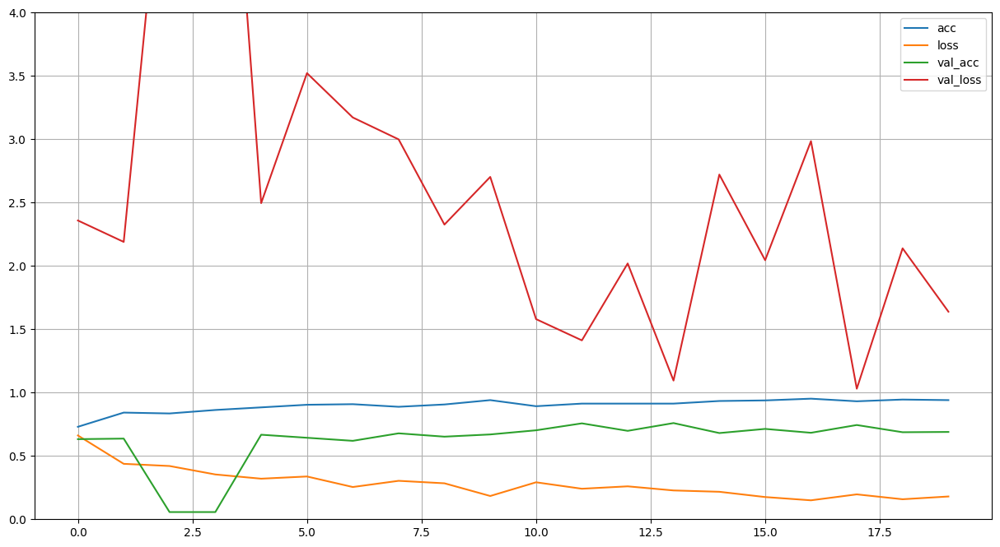

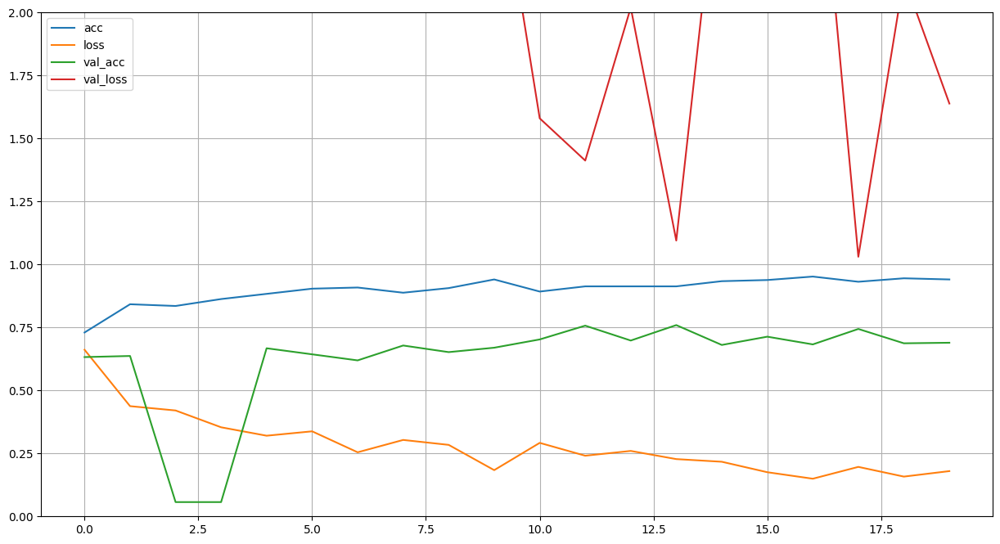

In [26]:
pd.DataFrame(history.history).plot(figsize=(15,8))
plt.grid(True)
plt.gca().set_ylim(0,4)
plt.show()

pd.DataFrame(history.history).plot(figsize=(15,8))
plt.grid(True)
plt.gca().set_ylim(0,2)
plt.show()

На графике показана история обучения модели: точность (acc, val_acc) и функция потерь (loss, val_loss) по эпохам.  

Точность (Accuracy):  
acc (синяя линия) — точность на обучающем наборе. Почти с самого начала она высокая (~0.95–0.98) и остаётся стабильной.  
val_acc (зелёная линия) — точность на валидации. Также держится стабильно, немного ниже acc, но без серьёзных просадок.  
Вывод: модель хорошо обучается и обобщается на валидации. Отсутствие расхождения между acc и val_acc говорит о том, что переобучение минимально. Обучение проходит успешно. Нет признаков переобучения: val_loss и val_acc не начинают ухудшаться. Можно рассмотреть увеличение числа эпох, если нужно ещё немного улучшить точность, или попробовать регуляризацию / аугментацию, если хочется более надёжной обобщаемости.

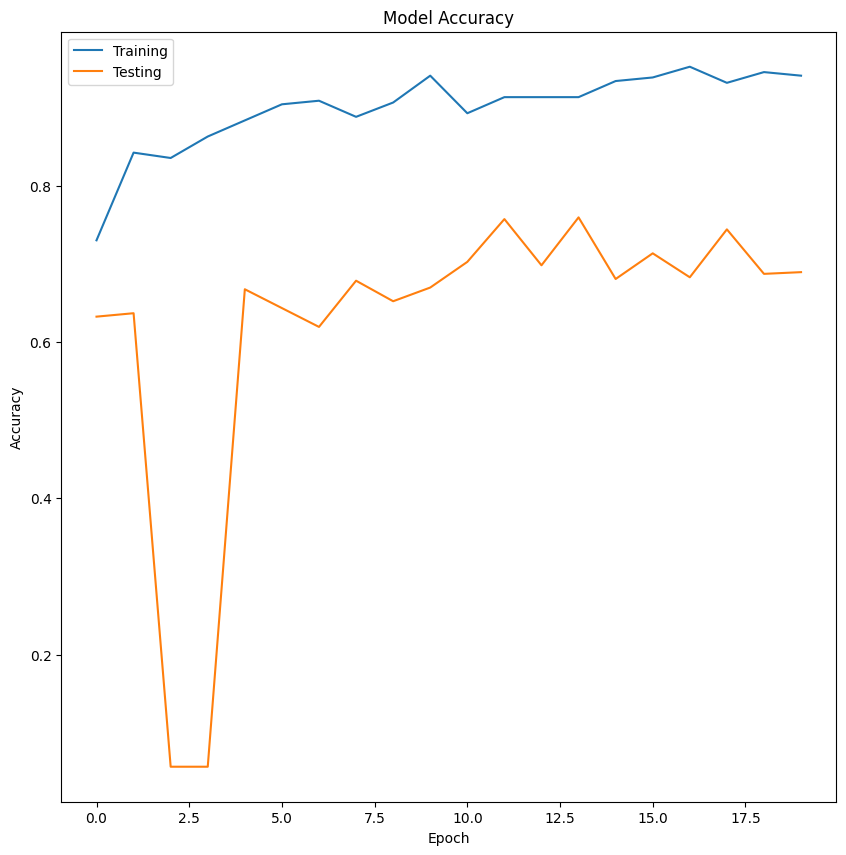

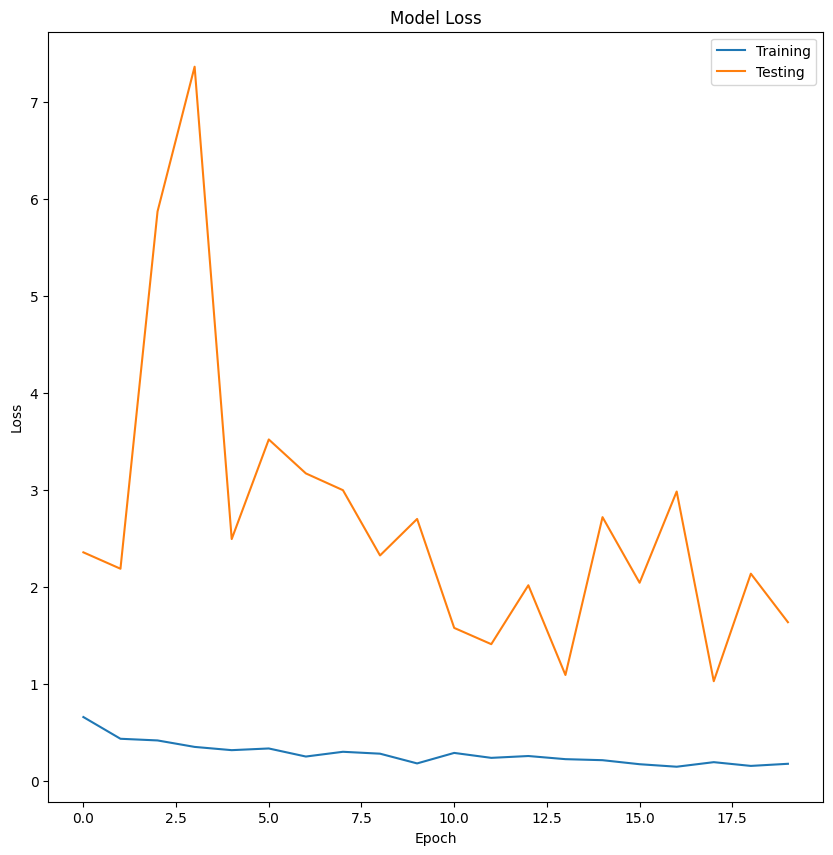

In [27]:
# Модель Acc
plt.figure(figsize=(10,10))

plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.show()
# plt.savefig('vgg_chest_accuracy.png')

# Модель Loss
plt.figure(figsize=(10,10))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Training', 'Testing'])
plt.show()
# plt.savefig('vgg_chest_loss.png')

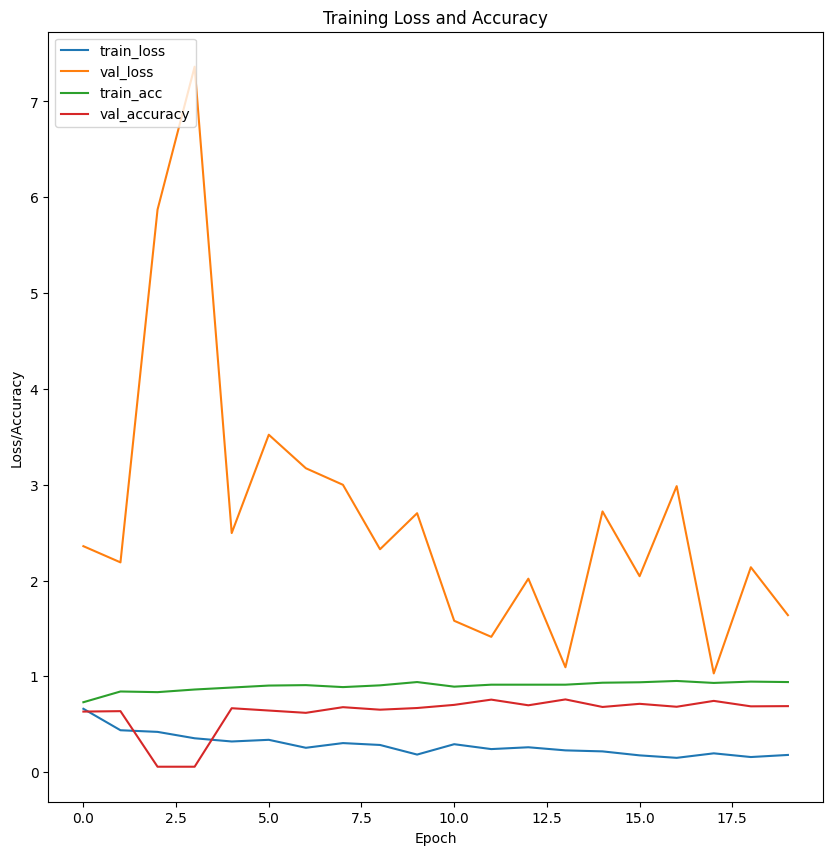

In [28]:
plt.figure(figsize=(10,10))
N = len(history.history['acc'])
plt.plot(np.arange(0, N), history.history["loss"], label="train_loss")
plt.plot(np.arange(0, N), history.history["val_loss"], label="val_loss")
plt.plot(np.arange(0, N), history.history["acc"], label="train_acc")
plt.plot(np.arange(0, N), history.history["val_acc"], label="val_accuracy")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="upper left")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
[[0. 0. 1.]]
Пациент с пневмонией... подхватил всякого разного


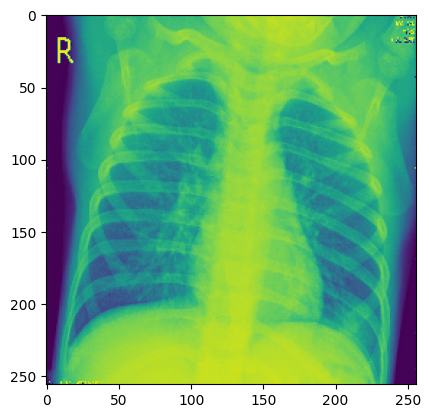

In [29]:
test_image_viral = tf.keras.preprocessing.image.load_img("./static/images/X-ray/test/Viral Pneumonia/VIRUS-262135-0001.jpeg", target_size=(256, 256), color_mode='grayscale')

plt.imshow(test_image_viral)

X = tf.keras.preprocessing.image.img_to_array(test_image_viral)
X = np.expand_dims(X, axis = 0)

prediction = np.vstack([X])

result = deep_model.predict(prediction)

print(result)

arg_max_result = np.argmax(result)

if arg_max_result == 0 :
    print("Пациент с ковидлой")
elif arg_max_result == 1 :
    print("Пациент здорового на вид рентгена")
elif arg_max_result == 2 :
    print("Пациент с пневмонией... подхватил всякого разного")

## Очередная попытка подключить Cuda

In [30]:
!nvidia-smi

!nvcc --version

Mon Jun 16 19:07:15 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 572.61                 Driver Version: 572.61         CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3070 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   45C    P5             21W /   40W |       0MiB /   8192MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Глубокое обучение на основе PyTorch

In [31]:
import torch 
import torch.nn.functional as F
import IPython.display as ipd
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

from torch import nn, optim, cuda
from torchvision import transforms, models, datasets
from torch.utils.data import Dataset, DataLoader
from sklearn.metrics import roc_curve, auc
from torch.utils.data import DataLoader, TensorDataset

In [32]:
PIC_SIZE = 256

def load_and_label_images_from_directory(directory, target_size=(256, 256)):
    images = []
    labels = []
    class_names = sorted(os.listdir(directory))

    for class_name in class_names:
        class_path = os.path.join(directory, class_name)
        if not os.path.isdir(class_path):
            continue
        for file in sorted(os.listdir(class_path)):
            if file.lower().endswith((".jpg", ".png", ".jpeg", ".bmp")):
                file_path = os.path.join(class_path, file)
                img = cv2.imread(file_path)
                if img is None:
                    continue
                img = cv2.resize(img, target_size)
                images.append(img)
                labels.append(class_name)

    return np.array(images), np.array(labels)

train_dir = "./static/images/X-ray hand/train"
val_dir = "./static/images/X-ray hand/test"

train_images_raw, train_labels_raw = load_and_label_images_from_directory(train_dir)
val_images_raw, val_labels_raw = load_and_label_images_from_directory(val_dir)

_, gauss_train, *_ = preprocess_images(train_images_raw)
_, gauss_val, *_ = preprocess_images(val_images_raw)

# Нормализация и преобразование
train_images_tensor = gauss_train.astype(np.float32) / 255.0
val_images_tensor = gauss_val.astype(np.float32) / 255.0

# Преобразование в grayscale
train_images_tensor = np.mean(train_images_tensor, axis=-1, keepdims=True)
val_images_tensor = np.mean(val_images_tensor, axis=-1, keepdims=True)

# Трансформируем в torch tensors
train_images_tensor = torch.tensor(train_images_tensor).permute(0, 3, 1, 2)
val_images_tensor = torch.tensor(val_images_tensor).permute(0, 3, 1, 2)

# Кодируем метки
label_encoder = LabelEncoder()
train_labels_encoded = torch.tensor(label_encoder.fit_transform(train_labels_raw), dtype=torch.long)
val_labels_encoded = torch.tensor(label_encoder.transform(val_labels_raw), dtype=torch.long)

# Создаем датасеты
train_dataset = TensorDataset(train_images_tensor, train_labels_encoded)
val_dataset = TensorDataset(val_images_tensor, val_labels_encoded)

BATCH_SIZE = 8
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE)

print(label_encoder.classes_)

['damage' 'no damage']


In [33]:
class SimpleCNN(nn.Module):
    def __init__(self, num_classes):
        super(SimpleCNN, self).__init__()
        self.conv_layers = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1), nn.ReLU(), nn.MaxPool2d(2)
        )
        
        self.fc_layers = nn.Sequential(
            nn.Flatten(),
            nn.Linear((PIC_SIZE // 4) * (PIC_SIZE // 4) * 64, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        return self.fc_layers(x)


In [34]:
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No CUDA device")

True
NVIDIA GeForce RTX 3070 Laptop GPU


In [35]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

num_classes = len(label_encoder.classes_)
model = SimpleCNN(num_classes).to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

train_loss_history = []
train_acc_history = []

EPOCHS = 30
for epoch in range(EPOCHS):
    model.train()
    running_loss, correct = 0.0, 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        correct += (outputs.argmax(1) == labels).sum().item()

    epoch_loss = running_loss / len(train_dataset)
    epoch_acc = correct / len(train_dataset)

    train_loss_history.append(epoch_loss)
    train_acc_history.append(epoch_acc)

    acc = correct / len(train_dataset)
    print(f"[{epoch+1}/{EPOCHS}] Loss: {running_loss:.4f} | Accuracy: {acc:.4f}")



[1/30] Loss: 92.9505 | Accuracy: 0.6111
[2/30] Loss: 18.2668 | Accuracy: 0.7778
[3/30] Loss: 9.0409 | Accuracy: 0.9167
[4/30] Loss: 3.2699 | Accuracy: 1.0000
[5/30] Loss: 1.1162 | Accuracy: 1.0000
[6/30] Loss: 0.1693 | Accuracy: 1.0000
[7/30] Loss: 0.0415 | Accuracy: 1.0000
[8/30] Loss: 0.0183 | Accuracy: 1.0000
[9/30] Loss: 0.0055 | Accuracy: 1.0000
[10/30] Loss: 0.0028 | Accuracy: 1.0000
[11/30] Loss: 0.0023 | Accuracy: 1.0000
[12/30] Loss: 0.0013 | Accuracy: 1.0000
[13/30] Loss: 0.0008 | Accuracy: 1.0000
[14/30] Loss: 0.0007 | Accuracy: 1.0000
[15/30] Loss: 0.0006 | Accuracy: 1.0000
[16/30] Loss: 0.0006 | Accuracy: 1.0000
[17/30] Loss: 0.0005 | Accuracy: 1.0000
[18/30] Loss: 0.0005 | Accuracy: 1.0000
[19/30] Loss: 0.0004 | Accuracy: 1.0000
[20/30] Loss: 0.0004 | Accuracy: 1.0000
[21/30] Loss: 0.0003 | Accuracy: 1.0000
[22/30] Loss: 0.0003 | Accuracy: 1.0000
[23/30] Loss: 0.0003 | Accuracy: 1.0000
[24/30] Loss: 0.0003 | Accuracy: 1.0000
[25/30] Loss: 0.0003 | Accuracy: 1.0000
[26/30]

In [36]:
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for images, labels in val_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        predicted = outputs.argmax(1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f"Validation Accuracy: {correct / total:.4f}")


Validation Accuracy: 1.0000


[[7.9026140e-06 9.9999213e-01]]
Пациент с живой рукой


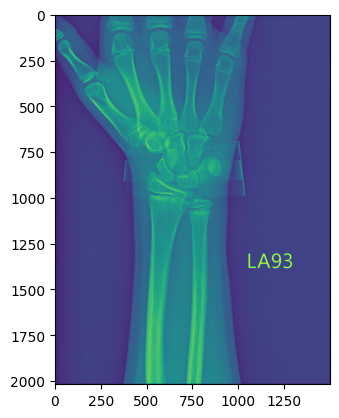

In [37]:
import torchvision.transforms as transforms
from PIL import Image

test_img = Image.open("./static/images/X-ray hand/no damage/4.jpg").convert('L')  # 'L'
plt.imshow(test_img)


transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

X = transform(test_img)
X = X.unsqueeze(0)
X = X.to(device)   

model.eval()
with torch.no_grad():
    outputs = model(X)
    probabilities = torch.nn.functional.softmax(outputs, dim=1)
    result = probabilities.cpu().numpy()

print(result)
arg_max_result = np.argmax(result)

if arg_max_result == 0:
    print("Пациент сломлен, как и его рука")
elif arg_max_result == 1:
    print("Пациент с живой рукой")

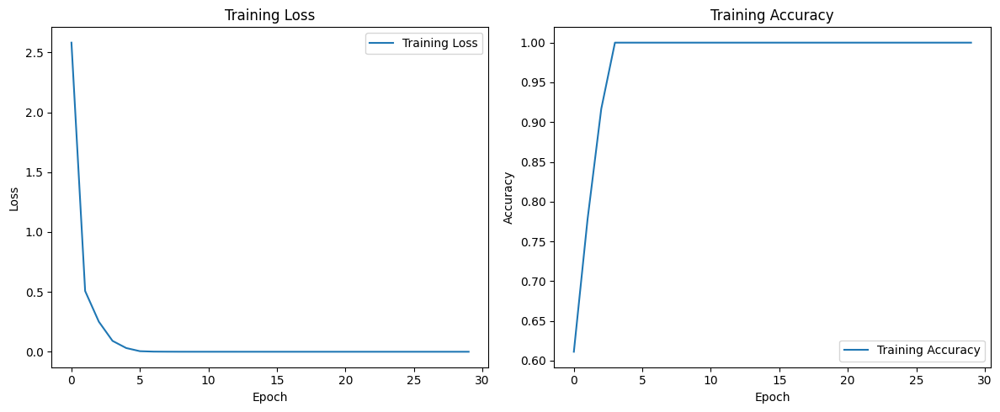

In [38]:
plt.figure(figsize=(12, 5))

# График Loss
plt.subplot(1, 2, 1)
plt.plot(train_loss_history, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.legend()

# График Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_acc_history, label='Training Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## Инициализация Keras  

В качестве бэкенда используется jax. Бэкенд должен указываться до импорта keras

In [72]:
import os
from keras.utils import image_dataset_from_directory
from keras.layers import Rescaling, Reshape
from keras.models import Sequential

os.environ["KERAS_BACKEND"] = "jax"
import keras

print(keras.__version__)

3.9.0


In [95]:
# === Параметры ===
PIC_SIZE = 256
BATCH_SIZE = 8
train_dir = "./static/images/X-ray/train"
val_dir = "./static/images/X-ray/test"

# === Загружаем вручную изображения и метки ===
train_images_raw, train_labels_raw = load_and_label_images_from_directory(train_dir, (PIC_SIZE, PIC_SIZE))
val_images_raw, val_labels_raw = load_and_label_images_from_directory(val_dir, (PIC_SIZE, PIC_SIZE))

# === Предобработка через твой метод ===
_, gauss_train, *_ = preprocess_images(train_images_raw, target_size=(PIC_SIZE, PIC_SIZE))
_, gauss_val, *_ = preprocess_images(val_images_raw, target_size=(PIC_SIZE, PIC_SIZE))

# === Нормализация [0, 255] → [0, 1] ===
train_images_keras = gauss_train.astype(np.float32) / 255.0
val_images_keras = gauss_val.astype(np.float32) / 255.0

# === One-hot кодировка меток ===
label_encoder = LabelEncoder()
train_labels_encoded = to_categorical(label_encoder.fit_transform(train_labels_raw))
val_labels_encoded = to_categorical(label_encoder.transform(val_labels_raw))

# Преобразуем изображения и метки в tf.data.Dataset
def convert_to_grayscale(image, label):
    image = tf.image.rgb_to_grayscale(image)
    return image, label

# Используем from_tensor_slices для передачи признаков и закодированных меток (целевой функции)
train_ds = tf.data.Dataset.from_tensor_slices((train_images_keras, train_labels_encoded))
val_ds = tf.data.Dataset.from_tensor_slices((val_images_keras, val_labels_encoded))

# Преобразуем изображения в оттенки серого
train_ds = train_ds.map(convert_to_grayscale)
val_ds = val_ds.map(convert_to_grayscale)

# Перемешиваем и объединяем в батчи
train_ds = train_ds.shuffle(1000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
val_ds = val_ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# === Вывод информации ===
print("Тренировочная и валидационная выборки сформированы.")
print("Классы:", label_encoder.classes_)

Тренировочная и валидационная выборки сформированы.
Классы: ['Covid' 'Normal' 'Viral Pneumonia']


In [96]:
# Модели
model_keras = Sequential([
    keras.layers.Input(shape=(PIC_SIZE, PIC_SIZE, 1)),
    keras.layers.Conv2D(32, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D(2, 2),

    keras.layers.Conv2D(64, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D(3, 3),

    keras.layers.Flatten(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(len(label_encoder.classes_), activation='softmax')
])

In [97]:
model_keras.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_19 (Conv2D)              │ (None, 254, 254, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 41, 41, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 107584)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │     6,885,440 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 3)              │           195 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,904,451 (26.34 MB)

 Trainable params: 6,904,451 (26.34 MB)

 Non-trainable params: 0 (0.00 B)

In [98]:
from keras.api.optimizers import SGD


model_keras.compile(optimizer=SGD(learning_rate=0.01), loss="categorical_crossentropy", metrics=['accuracy'])

# Обучение
model_keras.fit(train_ds, 
                epochs=100, 
                validation_data=val_ds)

Epoch 1/100


55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 103ms/step - accuracy: 0.5620 - loss: 0.9320 - val_accuracy: 0.4311 - val_loss: 1.0866
Epoch 2/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 5s 97ms/step - accuracy: 0.6873 - loss: 0.6596 - val_accuracy: 0.6740 - val_loss: 0.7476
Epoch 3/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 6s 102ms/step - accuracy: 0.8163 - loss: 0.4716 - val_accuracy: 0.6805 - val_loss: 0.6171
Epoch 4/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 5s 91ms/step - accuracy: 0.8701 - loss: 0.3404 - val_accuracy: 0.7068 - val_loss: 0.7827
Epoch 5/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 5s 99ms/step - accuracy: 0.9236 - loss: 0.2264 - val_accuracy: 0.6958 - val_loss: 1.2578
Epoch 6/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 5s 98ms/step - accuracy: 0.9454 - loss: 0.1744 - val_accuracy: 0.6696 - val_loss: 2.2355
Epoch 7/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - accuracy: 0.8652 - loss: 0.3732 - val_accuracy: 0.6871 - val_loss: 1.6744
Epoch 8/100
55/55 ━━━━━━━━━━━━━━━━━━━━ 5s 86ms/step - accuracy: 0.9241 - loss: 0.1915 - val_accuracy: 0.7330 - val

## Оценка качества модели

In [99]:
# Оценка модели на обучающем наборе
train_loss, train_acc = model_keras.evaluate(train_ds)
print(f"Train Loss: {train_loss}, Train Accuracy: {train_acc}")

55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 1.0000 - loss: 1.7020e-04
Train Loss: 0.00023883274116087705, Train Accuracy: 1.0


In [100]:
# Оценка модели на валидационном наборе
val_loss, val_acc = model_keras.evaluate(val_ds)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_acc}")

58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9355 - loss: 0.9708
Validation Loss: 3.213599443435669, Validation Accuracy: 0.7483588457107544


## Проектирование архитектуры более сложной  

In [110]:
model_keras_difficult = Sequential([
    keras.layers.Input(shape=(PIC_SIZE, PIC_SIZE, 1)),
    keras.layers.Conv2D(32, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D(),
    keras.layers.BatchNormalization(),

    keras.layers.Conv2D(64, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D(),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.4),

    keras.layers.Flatten(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(len(label_encoder.classes_), activation='softmax')
])

In [112]:
from keras.api.callbacks import EarlyStopping, ModelCheckpoint
from keras.api.optimizers import Adam

#early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
#checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_accuracy')

optimizer = Adam(learning_rate=0.0001)

model_keras_difficult.compile(optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Обучение
history = model_keras_difficult.fit(train_ds, 
                validation_data=val_ds, 
                epochs=15)
                #callbacks=[early_stop, checkpoint])

Epoch 1/15


55/55 ━━━━━━━━━━━━━━━━━━━━ 13s 215ms/step - accuracy: 0.8289 - loss: 0.8325 - val_accuracy: 0.6455 - val_loss: 1.6470
Epoch 2/15
55/55 ━━━━━━━━━━━━━━━━━━━━ 12s 212ms/step - accuracy: 0.8886 - loss: 0.3978 - val_accuracy: 0.6565 - val_loss: 1.6874
Epoch 3/15
55/55 ━━━━━━━━━━━━━━━━━━━━ 12s 215ms/step - accuracy: 0.9247 - loss: 0.2160 - val_accuracy: 0.6346 - val_loss: 2.9489
Epoch 4/15
55/55 ━━━━━━━━━━━━━━━━━━━━ 12s 220ms/step - accuracy: 0.9137 - loss: 0.2316 - val_accuracy: 0.6740 - val_loss: 2.0915
Epoch 5/15
55/55 ━━━━━━━━━━━━━━━━━━━━ 11s 207ms/step - accuracy: 0.9129 - loss: 0.2641 - val_accuracy: 0.6761 - val_loss: 1.7603
Epoch 6/15
55/55 ━━━━━━━━━━━━━━━━━━━━ 11s 203ms/step - accuracy: 0.9227 - loss: 0.1657 - val_accuracy: 0.6761 - val_loss: 1.5094
Epoch 7/15
55/55 ━━━━━━━━━━━━━━━━━━━━ 11s 202ms/step - accuracy: 0.9302 - loss: 0.2383 - val_accuracy: 0.6783 - val_loss: 1.6818
Epoch 8/15
55/55 ━━━━━━━━━━━━━━━━━━━━ 11s 198ms/step - accuracy: 0.9436 - loss: 0.1223 - val_accuracy: 0.678

## Оценка более сложной нейронной сети (системы)

In [114]:
# Оценка модели на обучающем наборе
train_loss, train_acc = model_keras.evaluate(train_ds)
print(f"Train Loss: {train_loss}, Train Accuracy: {train_acc}")

# Оценка модели на валидационном наборе
val_loss, val_acc = model_keras.evaluate(val_ds)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_acc}")

55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 1.0000 - loss: 2.3448e-04
Train Loss: 0.00023883269750513136, Train Accuracy: 1.0
58/58 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9355 - loss: 0.9708
Validation Loss: 3.213599443435669, Validation Accuracy: 0.7483588457107544


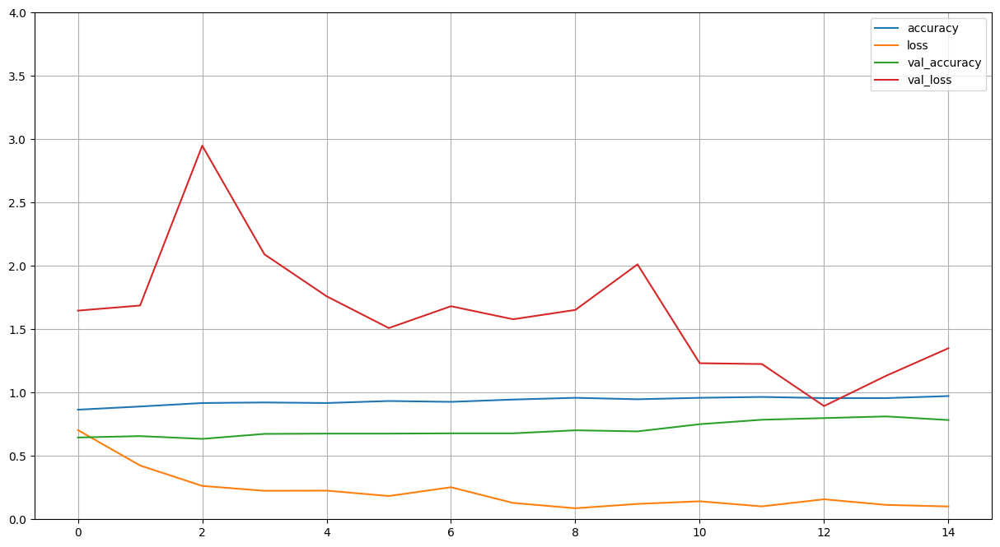

In [115]:
pd.DataFrame(history.history).plot(figsize=(15,8))
plt.grid(True)
plt.gca().set_ylim(0,4)
plt.show()

58/58 ━━━━━━━━━━━━━━━━━━━━ 2s 32ms/step


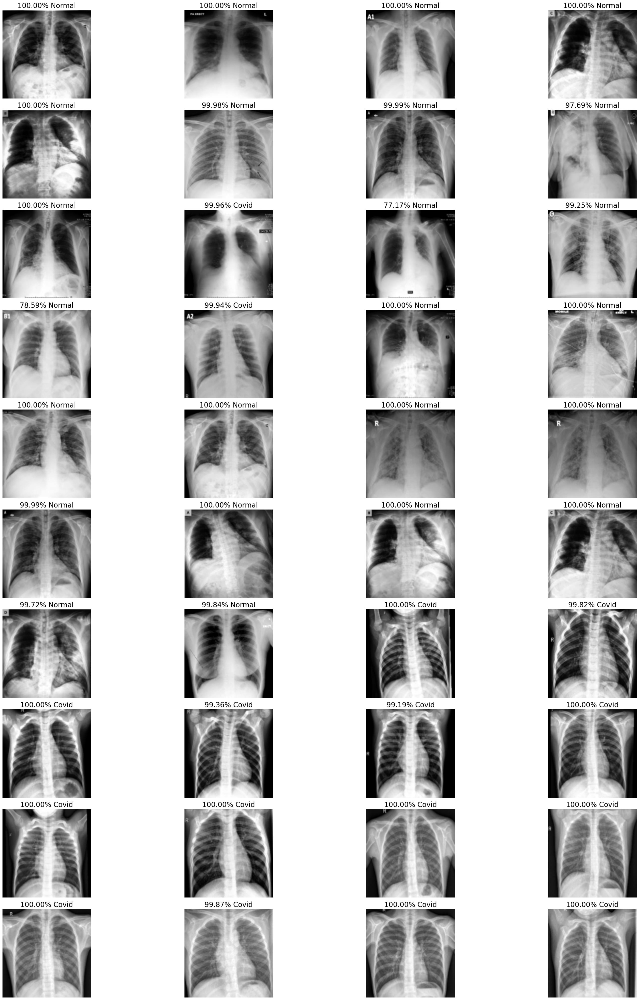

In [116]:
predict_label = []

# Получаем предсказания для всех изображений в val_ds
y_pred = model_keras_difficult.predict(val_ds)

# Берём только первые 40 предсказаний
prediction = y_pred[0:40]

# Итератор по датасету
val_ds_iter = iter(val_ds)

# Собираем 40 изображений
images_list = []
while len(images_list) < 40:
    images, _ = next(val_ds_iter)
    for image in images:
        if len(images_list) >= 40:
            break
        images_list.append(image)

# Визуализация 10 строк по 4 изображения
plt.figure(figsize=(32, 40))  # увеличенный размер фигур

for i in range(40):
    plt.subplot(10, 4, i + 1)
    image = images_list[i].numpy().squeeze()

    # Проверка: grayscale или RGB
    if image.ndim == 2:
        plt.imshow(image, cmap='gray')
    else:
        plt.imshow(image)

    prob = prediction[i][1]
    label = f"{prob*100:.2f}% Covid" if prob > 0.5 else f"{(1 - prob)*100:.2f}% Normal"
    predict_label.append(label)
    plt.title(label, fontsize=20)
    plt.axis('off')

plt.tight_layout()
plt.show()
